In [23]:
%run -i "../Retropy_framework.py"

iPy: True


In [29]:
etfs = [VBR, IJR, VLUE, USMV, MTUM]
reit = [VNQ, VNQI]
base = [QQQ, QLD, SPY, SSO, VXUS]

Fetching VNQI from AV .. DONE


In [30]:
all = get(etfs + base + reit)

In [31]:
def show_cum_income(*all):
    income = lmap(lambda x: get_income(x, smooth=0), all)
    income = [x.cumsum() for x in income]
    show(income, ta=False, log=False, legend=False, title="net income")

def analyze_assets(*all, start=None, despike=True):
    all = get(all, start=start, despike=despike) # note we don't trim
    
    bases = [ mix(lc, gb, do_get=False), mix(i_ac, gb, do_get=False)]
    lst = get(all + bases, mode="TR", reget=True)
    show_risk_return(*lst, title="TR Risk-Return")
    lst = get(all + bases, mode="NTR", reget=True)
    show_risk_return(*lst, title="NTR Risk-Return")
    lst = get(all + bases, mode="PR", reget=True)
    show_risk_return(*lst, title="PR Risk-Return")
    show_risk_return_modes(*all)
    
    show_risk_return_modes(*all, ret_func=get_curr_yield, modes=['TR'], title='Risk-Yield TR')
    show_risk_return_modes(*all, ret_func=get_curr_yield, modes=['NTR'], title='Risk-Yield NTR')
    show_risk_yield(*all)
    
    show_cum_income(*all)
    show_cum_income(*get(all, trim=True))
    
    show(lmap(adj_inf, lmap(price, all)), 1, title="real price")

    income = lmap(get_income, all)
    show(income, income[0].mean(), 0, ta=False, log=False, title="net income")

    show(lmap(roi, all), ta=False, log=False, title="net ROI")

    yields = lmap(get_real_yield, all)
    yields[0] = ma(yields[0], 8).dropna()
    show(yields, 0, ta=False, log=False, title="real gross yield")

    yields = lmap(getYield, all)
    yields[0] = ma(yields[0], 8).dropna()
    show(yields, get_inflation(365*7)[getCommonDate(yields, agg=min):], 0, ta=False, log=False, title="nominal gross yield")    
    
    lrret_mutual(all)
    
#show_cum_income(*all)


dropped: USMV, VLUE, MTUM, VNQI, VXUS
trimmed data from 1990-01-02 [VFINX] to 1995-01-03 [VFITX]
trimmed data from 1995-01-03 [VFITX] to 1996-04-29 [VGTSX]
trimmed data from 1990-01-02 [VFINX=lc] to 1995-01-03 [VFITX=gb, <noname>, +10 more]
trimmed data from 1995-01-03 [VFITX=gb] to 1996-04-29 [<noname>, <noname>, +10 more]
trimmed data from 1995-01-03 [SPY, VFITX=gb, +12 more] to 2006-06-21 [QLD, SSO]


trimmed data from 1995-01-03 [SPY] to 2006-06-21 [QLD, SSO]



Cross:
VBR: IJR:73.9|VNQ:15.4|SPY:5.5|SSO:1.3   R^2: 0.990
IJR: VBR:78.4|QQQ:14.9|QLD:4.1   R^2: 0.992
QQQ: QLD:43.3|IJR:38.7|VNQ:10.7   R^2: 0.953
QLD: QQQ:100.0   R^2: 0.457


../Retropy_framework.py:2211: RuntimeWarning:

invalid value encountered in log



SPY: QQQ:31.0|VBR:22.4|SSO:21.4|VNQ:2.4   R^2: 0.997
SSO: SPY:75.1|QLD:24.9   R^2: 0.928
VNQ: VBR:76.6|SSO:2.9   R^2: 0.818

Incremental:
trimmed data from 1990-01-02 [VFINX = lc] to 2006-06-21 [QLD, SSO]
QLD: lc:100.0   R^2: 0.305
VNQ: QLD:35.8   R^2: 0.739
SSO: QLD:57.8   R^2: 0.915
QQQ: QLD:59.4|VNQ:18.7   R^2: 0.944
VBR: QQQ:41.9|VNQ:24.8|SSO:14.4   R^2: 0.965
IJR: VBR:78.4|QQQ:14.9|QLD:4.1   R^2: 0.992
SPY: QQQ:31.0|VBR:22.4|SSO:21.4|VNQ:2.4   R^2: 0.997


<Figure size 864x576 with 0 Axes>

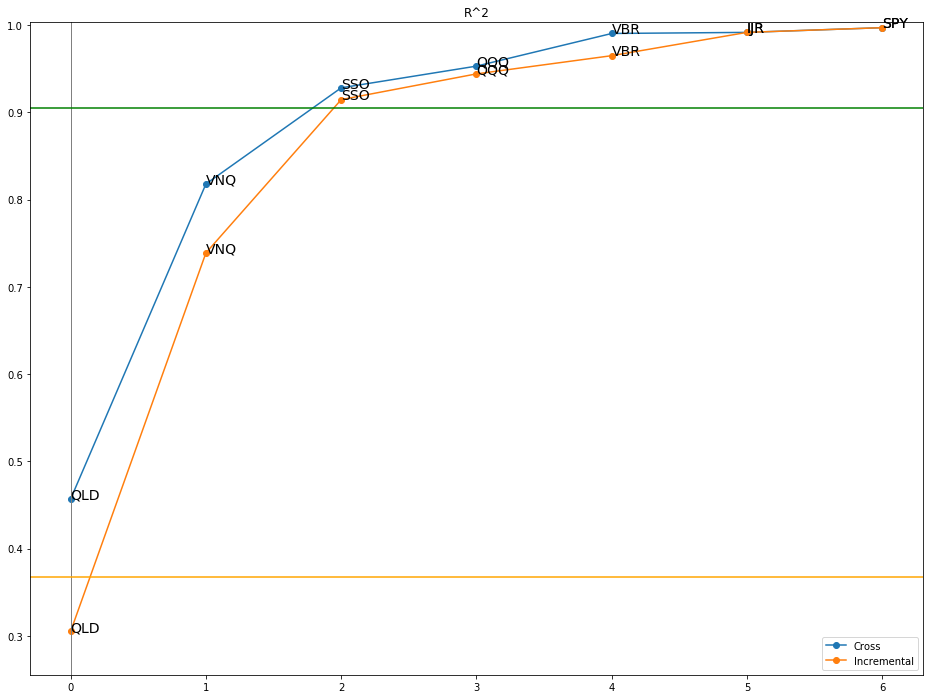

In [32]:
analyze_assets(*all, start=2008)

In [28]:
p = "VBR|IJR|VLUE|USMV|MTUM"
lrret(p, all)

trimmed data from 2000-05-26 [IJR] to 2013-04-18 [VLUE, MTUM]


R^2: 0.9999999977062144


IJR    0.2001
USMV   0.2001
VLUE   0.2001
MTUM   0.1998
VBR    0.1998
SPY    0.0001
QLD    0.0000
VXUS   0.0000
SSO    0.0000
QQQ    0.0000
dtype: float64